In [1]:
'''
Complete the LoadData function for this assignment, and create the decision tree for diabetes data
'''

'\nComplete the LoadData function for this assignment, and create the decision tree for diabetes data\n'

In [2]:
import sklearn
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
import numpy as np
from sklearn.metrics import accuracy_score

In [3]:
# import 'Pandas' 
import pandas as pd 

# import subpackage of Matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# import 'Seaborn' 
import seaborn as sns

# to suppress warnings 
from warnings import filterwarnings
filterwarnings('ignore')

# display all columns of the dataframe
pd.options.display.max_columns = None

# display all rows of the dataframe
pd.options.display.max_rows = None
 
# to display the float values upto 6 decimal places     
pd.options.display.float_format = '{:.6f}'.format

# import train-test split 
from sklearn.model_selection import train_test_split

# import various functions from statsmodels
import statsmodels
import statsmodels.api as sm

# import StandardScaler to perform scaling
from sklearn.preprocessing import StandardScaler 

# import various functions from sklearn 
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import accuracy_score

# import function to perform feature selection
from sklearn.feature_selection import RFE

In [4]:
import LoadData as ld
print (__name__)
print (ld.LoadData.__defaults__)

Importing LoadData
__main__
(',', True)


In [5]:
filename = "bill_authentication.csv"
cols = ["Variance", "Skewness", "Curtosis", "Entropy", "Class"]
x_train,y_train,x_test,y_test = ld.LoadData(filename, cols, normalize=False)
print (x_train.shape, x_test.shape)

(1097, 4)
(1097, 4) (275, 4)


In [6]:
logreg = sm.Logit(y_train, x_train).fit()

# print the summary of the model
print(logreg.summary())

Optimization terminated successfully.
         Current function value: 0.080353
         Iterations 11
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 1097
Model:                          Logit   Df Residuals:                     1093
Method:                           MLE   Df Model:                            3
Date:                Fri, 16 Jul 2021   Pseudo R-squ.:                  0.8694
Time:                        18:27:49   Log-Likelihood:                -88.147
converged:                       True   LL-Null:                       -675.04
                                        LLR p-value:                3.565e-254
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -2.7673      0.308     -8.980      0.000      -3.371      -2.163
x2            -1.6504      0

In [7]:
print('AIC:', logreg.aic)

AIC: 184.29486495596464


In [8]:
df_odds = pd.DataFrame(np.exp(logreg.params), columns= ['Odds']) 

# print the dataframe
df_odds

,Odds
0,0.062829
1,0.191981
2,0.171255
3,0.482147


In [9]:
y_pred_prob = logreg.predict(x_test)
th = 0.5
# print the y_pred_prob
print (y_pred_prob[:5])
print ("When Threshold = ", th, y_pred_prob[:5] > th)
print(y_test[:5])

[0.81368376 0.97238434 0.98048262 0.09492736 0.05661629]
When Threshold =  0.5 [ True  True  True False False]
[[1]
 [1]
 [1]
 [1]
 [1]]


In [10]:
th = 0.04
print ("When Threshold = ", th, y_pred_prob[:5] > th)
print(y_test[:5])

When Threshold =  0.04 [ True  True  True  True  True]
[[1]
 [1]
 [1]
 [1]
 [1]]


In [11]:
## DecisionTreeClassifier gini
model = DecisionTreeClassifier(criterion = "gini", splitter = "best")
model.fit(x_train, y_train)
y_pred_test = model.predict(x_test)
y_pred_train = model.predict(x_train)
print ("Test data accuracy", accuracy_score(y_test, y_pred_test))
print ("Train data accuracy", accuracy_score(y_train, y_pred_train))
print ("Train Data score", model.score(x_train, y_train))

Test data accuracy 0.9818181818181818
Train data accuracy 1.0
Train Data score 1.0


In [12]:
print ("Train Data score", model.score(x_train, y_train)) #Returns mean accuracy of test samples
print ("Test Data score", model.score(x_test, y_test))

Train Data score 1.0
Test Data score 0.9818181818181818


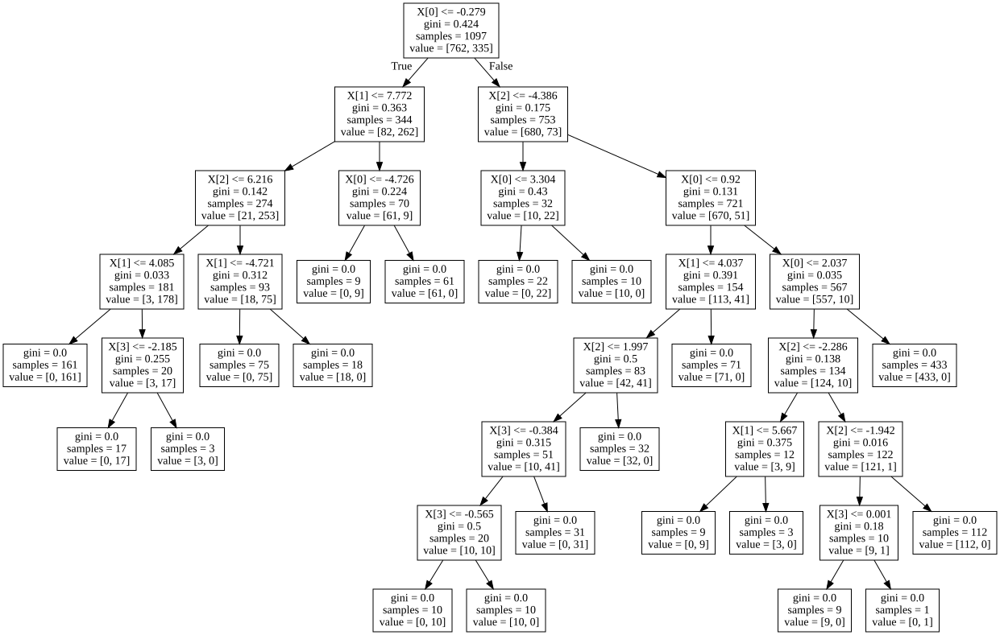

In [13]:
import os
import graphviz
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'
dot_data = tree.export_graphviz(model, out_file=None)
graph = graphviz.Source(dot_data) 
graph

In [14]:
model.set_params(splitter="random")
model.fit(x_train, y_train)
y_pred_test = model.predict(x_test)
y_pred_train = model.predict(x_train)
print ("Test data accuracy", accuracy_score(y_test, y_pred_test))
print ("Train data accuracy", accuracy_score(y_train, y_pred_train))
print ("Train Data score", model.score(x_train, y_train))
print ("Train Data score", model.score(x_test, y_test))


Test data accuracy 0.9890909090909091
Train data accuracy 1.0
Train Data score 1.0
Train Data score 0.9890909090909091


In [15]:
models = [(DecisionTreeClassifier(criterion = "gini", splitter = "best"), "gini"),
             (DecisionTreeClassifier(criterion="entropy"), "entropy"),
          (DecisionTreeClassifier(criterion = "gini", splitter = "random"), "Random")
         ]
for m in models:
    m[0].fit(x_train, y_train)
    y_pred_train = (m[0].predict(x_train))
    y_pred_test = (m[0].predict(x_test))
    print ("Testing data set, using =  ", m[1], "Accuracy= ",  accuracy_score(y_test, y_pred_test))
    print ("Training data set, using =  ", m[1], "Accuracy= ", accuracy_score(y_train, y_pred_train))

Testing data set, using =   gini Accuracy=  0.9818181818181818
Training data set, using =   gini Accuracy=  1.0
Testing data set, using =   entropy Accuracy=  0.9745454545454545
Training data set, using =   entropy Accuracy=  1.0
Testing data set, using =   Random Accuracy=  0.9818181818181818
Training data set, using =   Random Accuracy=  1.0


In [16]:
print (__name__)
#print (globals()["x_train"])

__main__


In [17]:
#Steps to address overfitting
modelOF1 = [(DecisionTreeClassifier(criterion = "gini", splitter = "best", max_depth=4))]

In [19]:
from sklearn.model_selection import GridSearchCV
tuned_paramaters = [{'criterion': ['entropy', 'gini'], 
                     'max_depth': range(2, 10),
                     'max_features': ["sqrt", "log2"],
                     'min_samples_split': range(2,10),
                     'min_samples_leaf': range(1,10),
                     'max_leaf_nodes': range(1, 10)}]
 
# instantiate the 'DecisionTreeClassifier' 
# pass the 'random_state' to obtain the same samples for each time you run the code
decision_tree_classification = DecisionTreeClassifier(random_state = 100)

# use GridSearchCV() to find the optimal value of the hyperparameters
# estimator: pass the decision tree classifier model
# param_grid: pass the list 'tuned_parameters'
# cv: number of folds in k-fold i.e. here cv = 5
tree_grid = GridSearchCV(estimator = decision_tree_classification, 
                         param_grid = tuned_paramaters, 
                         cv = 5, verbose=2)

# fit the model on X_train and y_train using fit()
tree_grid_model = tree_grid.fit(x_train, y_train)

# get the best parameters
print('Best parameters for decision tree classifier: ', tree_grid_model.best_params_, '\n')

Fitting 5 folds for each of 20736 candidates, totalling 103680 fits
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_sa

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=entropy, max_de

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=sqrt

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=2, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=sqrt

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2

[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=3, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=sqrt

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2

[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=4, max_features=log2, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=sqrt

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=5, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=sqrt

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=6, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=sqrt

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=1, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=7, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=sqrt

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=1, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=2, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=7, min_samples_leaf=9, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=8, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=3, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=5, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=8, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=4, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=sqrt

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=1, min_samples_leaf=7, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=2, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=1, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=3, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=5, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=7, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=3, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=4, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=4, min_samples_leaf=8, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=4, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=5, min_samples_leaf=9, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=6, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=8, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=6, min_samples_leaf=9, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=5, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=7, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=7, min_samples_leaf=8, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=1, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=3, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=4, min_samples_split=9; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=5, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=7, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=8, min_samples_leaf=9, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=2, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=4; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=6, min_samples_split=5; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=6; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=7; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2, max_leaf_nodes=9, min_samples_leaf=8, min_samples_split=8; total time=   0.0s
[CV] END criterion=gini, max_depth=9, max_features=log2

In [20]:
dt_model = DecisionTreeClassifier(criterion = tree_grid_model.best_params_.get('criterion'),
                                  max_depth = tree_grid_model.best_params_.get('max_depth'),
                                  max_features = tree_grid_model.best_params_.get('max_features'),
                                  max_leaf_nodes = tree_grid_model.best_params_.get('max_leaf_nodes'),
                                  min_samples_leaf = tree_grid_model.best_params_.get('min_samples_leaf'),
                                  min_samples_split = tree_grid_model.best_params_.get('min_samples_split'),
                                  random_state = 10)

# use fit() to fit the model on the train set
dt_model = dt_model.fit(x_train, y_train)

In [22]:
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
rf_c = RandomForestClassifier(n_estimators = 10, random_state = 10)

# use fit() to fit the model on the train set
rf_model = rf_c.fit(x_train, y_train)

In [23]:

tuned_paramaters = [{'criterion': ['entropy', 'gini'],
                     'n_estimators': [10, 30, 50],
                     'max_depth': [10, 15, 20],
                     'max_features': ['sqrt', 'log2'],
                     'min_samples_split': [2, 5],
                     'min_samples_leaf': [1, 5],
                     'max_leaf_nodes': [2, 5, 11]}]
 
# instantiate the 'RandomForestClassifier' 
# pass the 'random_state' to obtain the same samples for each time you run the code
random_forest_classification = RandomForestClassifier(random_state = 10)

# use GridSearchCV() to find the optimal value of the hyperparameters
# estimator: pass the random forest classifier model
# param_grid: pass the list 'tuned_parameters'
# cv: number of folds in k-fold i.e. here cv = 5
rf_grid = GridSearchCV(estimator = random_forest_classification, 
                       param_grid = tuned_paramaters, 
                       cv = 5)

# use fit() to fit the model on the train set
rf_grid_model = rf_grid.fit(x_train, y_train)

# get the best parameters
print('Best parameters for random forest classifier: ', rf_grid_model.best_params_, '\n')

Best parameters for random forest classifier:  {'criterion': 'entropy', 'max_depth': 10, 'max_features': 'sqrt', 'max_leaf_nodes': 11, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 30} 



In [25]:
print (rf_model.feature_importances_)

[0.5453972  0.23655429 0.17968903 0.03835949]


In [26]:
#Now lets do the same problem using AaBoostClassifier and GradientBoosting Classifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier

In [28]:
ada_m = AdaBoostClassifier(n_estimators = 40, random_state = 10)

# fit the model using fit() on train data
ada_m.fit(x_train, y_train)

AdaBoostClassifier(n_estimators=40, random_state=10)

In [29]:
gboost_m = GradientBoostingClassifier(n_estimators = 150, max_depth = 10, random_state = 10)

# fit the model using fit() on train data
gboost_m.fit(x_train, y_train)

GradientBoostingClassifier(max_depth=10, n_estimators=150, random_state=10)

In [31]:
xgb_m = XGBClassifier(max_depth = 10, gamma = 1)

# fit the model using fit() on train data
xgb_m.fit(x_train, y_train)

XGBClassifier(gamma=1, max_depth=10)

In [33]:
tuning_parameters = {'learning_rate': [0.1, 0.2, 0.3],
                     'max_depth': range(3,10),
                     'gamma': [0, 1, 2, 3, 4]}

# instantiate the 'XGBClassifier' 
xgb_m = XGBClassifier()

# use GridSearchCV() to find the optimal value of the hyperparameters
# estimator: pass the XGBoost classifier model
# param_grid: pass the list 'tuned_parameters'
# cv: number of folds in k-fold i.e. here cv = 3
# scoring: pass a measure to evaluate the model on test set
xgb_grid = GridSearchCV(estimator = xgb_m, param_grid = tuning_parameters, cv = 3, scoring = 'roc_auc')

# fit the model on X_train and y_train using fit()
xgb_grid.fit(x_train, y_train)

# get the best parameters
print('Best parameters for XGBoost classifier: ', xgb_grid.best_params_, '\n')

Best parameters for XGBoost classifier:  {'gamma': 0, 'learning_rate': 0.2, 'max_depth': 3} 



In [35]:
tuning_parameters = {'learning_rate': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6],
                     'max_depth': range(3,10),
                     'gamma': [0, 1, 2, 3, 4]}

# instantiate the 'XGBClassifier' 
xgb_model = XGBClassifier()

# use GridSearchCV() to find the optimal value of the hyperparameters
# estimator: pass the XGBoost classifier model
# param_grid: pass the list 'tuned_parameters'
# cv: number of folds in k-fold i.e. here cv = 3
# scoring: pass a measure to evaluate the model on test set
xgb_grid = GridSearchCV(estimator = xgb_model, param_grid = tuning_parameters, cv = 3, scoring = 'roc_auc')

# fit the model on X_train and y_train using fit()
xgb_grid.fit(x_train, y_train)

# get the best parameters
print('Best parameters for XGBoost classifier: ', xgb_grid.best_params_, '\n')

Best parameters for XGBoost classifier:  {'gamma': 0, 'learning_rate': 0.6, 'max_depth': 3} 



In [37]:
def get_test_report(model, X_test, y_test):
    
    # for y_test
    # predict the output of the target variable from the test data 
    test_pred = model.predict(X_test)

    # return the classification report for test data
    return(classification_report(y_test, test_pred))

In [68]:
def plot_confusion_matrix(model, x, y):
    y_pred = model.predict(x)
    
    # create a confusion matrix
    cm = confusion_matrix(y, y_pred)
    print (cm.shape)
    print (cm, cm.size)
    if (cm.size ==1):
        cm1 =np.ones((2,2))
        cm1[0,0] = cm[0,0]
        print (cm1.shape, cm1)
        cm = cm1
           
    conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])

    sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
                linewidths = 0.1, annot_kws = {'size':25})

    plt.xticks(fontsize = 20)

    plt.yticks(fontsize = 20)

    # display the plot
    plt.show()

In [66]:
xgb_grid_model = XGBClassifier(learning_rate = xgb_grid.best_params_.get('learning_rate'),
                               max_depth = xgb_grid.best_params_.get('max_depth'),
                              gamma = xgb_grid.best_params_.get('gamma'))

# use fit() to fit the model on the train set
xgb_model = xgb_grid_model.fit(x_train, y_train)

# print the performance measures for test set for the model with best parameters
print('Classification Report for test set:\n', get_test_report(xgb_model, x_test, y_test))

Classification Report for test set:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00       275

    accuracy                           1.00       275
   macro avg       1.00      1.00      1.00       275
weighted avg       1.00      1.00      1.00       275



(2, 2)
[[762   0]
 [  0 335]] 4


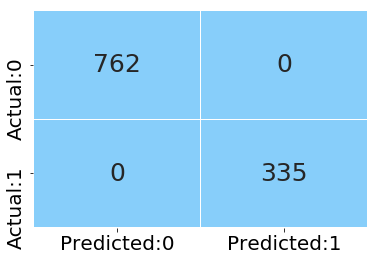

In [67]:
plot_confusion_matrix(xgb_model, x_train, y_train)